# **Tutorial 2 - Representation Learning**

## **Learning Objectives**
* Understand Hopfield Network
* Build a basic Hopfield Network so memorize random binary patterns
* Explore the behaviours and limitations of these Hopfield Networks
* Build a "Modern" Hopfield Network and train it to memorise flags 
</div>

**Quizz**: answer the questions in the form [here](https://docs.google.com/forms/d/e/1FAIpQLSeG-IVQwHgJybNK4cTxm5oEyxlwUCa7zmEWKycX-EPugHvvRA/viewform?usp=publish-editor)

## **Contents** 
0. [Import dependencies and data](#dependencies)
1. [Making random patterns](#random-patterns)
2. [Making a basic Hopfield Network](#hopfield)
    1. [Weight matrix](#weights)
    2. [Update function](#update)
    3. [Energy function](#energy)
3. [Testing the Hopfield Network](#testing)
    1. [Pattern stability](#stability)
    2. [Pattern denoising](#denoising)
    3. [Pattern completion](#completion)
    4. [Negative patterns](#negative)
    5. [Spurious states](#spurious)
    6. [Strong patterns](#strong)
    7. [Memory capacity](#capacity)
    8. [Complex patterns (faces)](#faces)
4. [Modern Hopfield Networks](#modern)
    1. [Face Championship!](#face-championship)
    2. [Inverse "temperature"](#temperature)

---
## **0. Importing dependencies and data** <a name="dependencies"></a>
Run the following code: It'll install some dependencies, download some files and import some functions. You can mostly ignore it. 

In [1]:
#@title Run this code, but feel free to ignore it. {display-mode: "form" }
#if running locally, you can remove packages already installed from list below
!pip install numpy matplotlib ipywidgets tqdm wget

#%load_ext autoreload
#%autoreload 2

#import a load of helper / plotting functions this tutorial uses but you don't need to worry about
import os
import wget 
import pickle
import matplotlib.pyplot as plt

#if running on colab we need to download the data and utils files

#downloads the utils functions 
if os.path.exists("hopfield_networks_utils.py"): pass
else: wget.download("https://github.com/ahyafil/MBC_NeuroAI/raw/refs/heads/main/A2_RepresentationLearning/hopfield_networks_utils.py"); print("...utils downloaded!")

#downloafs the face data 
if os.path.exists("faces.pkl"): pass
else: wget.download("https://github.com/ahyafil/MBC_NeuroAI/raw/refs/heads/main/A2_RepresentationLearning/faces.pkl"); print("...faces downloaded!")

#downloads other images used in the notebook
if os.path.isdir("./images"): pass
else: 
    wget.download("https://github.com/ahyafil/MBC_NeuroAI/raw/refs/heads/main/A2_RepresentationLearning/images.zip")
    !unzip -o images.zip
    print("...images downloaded and unzipped!")
print("Done!")

from hopfield_networks_utils import * 


Done!


---
## **1. Making random binary patterns** <a name="random-patterns"></a>

Hopfield networks were some of the earliest computational models of memory. 

A Hopfield network contains many recurrently connected neurons which talk to each other. 

They store a set of $N$ memories $\{ \xi_i^{(n)} \}$ for $1 \leq n \leq N$.

We'll start off by training a _classical_ (binary) Hopfield network to store 5 patterns. 
* Each patterns will be a 6 x 6 random binary pattern. 
* These will be stored in a python dictionary `random_patterns`
* We can visualise them by calling `plot_patterns(random_patterns)`


Text(0.5, 0.98, 'These are 5 patterns our network will memorize')

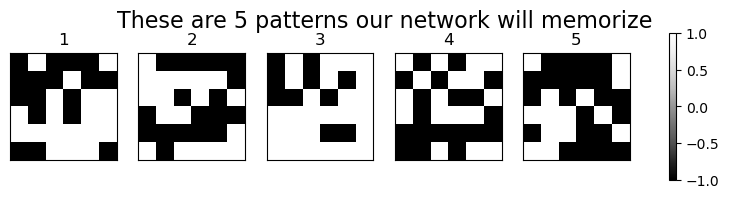

In [2]:
#Create 5 random patterns
np.random.seed(42)
N_patterns = 5
pattern_size = (6,6)
random_patterns = {str(i) : np.random.choice([-1,1],size=pattern_size) for i in range(1,N_patterns+1)}

fig, ax = plot_patterns(random_patterns)
fig.suptitle(f"These are {random_patterns.__len__()} patterns our network will memorize", fontsize=16)

---
## **2.0 Making a Hopfield Network** <a name="hopfield"></a>

Below we provide some basic code defining a Hopfield Network class. 
You don't need to understand this but it'll be useful to know what important attributes and functions it contains.

Suppose we initialise a network `HFN = HopfieldNetwork(random_patterns)`

**Important attributes** 

* `HFN.state` is the current state of the network, a vector $s \in \mathbb{R}^{N_{\textrm{neurons}}}$
* `HFN.w` is the synpatic weight matrix. 
* `HFN.patterns` is a matrix containing all the patterns in their original shape 
* `HFN.N_neurons` how many neurons the network has 
* `HFN.flattened_patterns` is a matrix of stored _flattened_ patterns $\Xi \in \mathbb{R}^{N_{\textrm{Patterns}} \times N_{\textrm{neurons}}}$ such that $\Xi_{n,i} \equiv \xi^{(n)}_{i}$ is the $i^{\textrm{th}}$ element of the $n^{\textrm{th}}$ pattern. 
* `HFN.similarities` is a measure of similarity (a number from 0 to 1) between the current state and all saved patterns, $\textrm{sim} \in \mathbb{R}^{N_{\textrm{patterns}}}$. 
* `HFN.energy` is the energy of the current state of the Hopfield network 
* `HFN.history` is a dictionary containing all past `state`s,  `similarity`s and `energy`s of the network. 

**Important methods**

* `HFN.update_state()`: Takes the current state and updates it $s(t) \leftarrow s(t+1)$. Then, the `state` and `similarities` are saved to history.
* `HFN.set_state(state)`: Sets the state of the network to whatever you pass as `state`. Alternatively pass HFN.set_state(random=True)` to reinitialise. 
* `HFN.visualise()`: Displays the current state of the network next to a bar chart of how similar it is to all the saved patterns. 
* `HFN.plot_energy(n_steps)`: Plots the evolution of the energy of the Hopfield netowrk over the past `n_steps`
* `HFN.animate(n_steps)`: Makes a short video displaying the evolution of the state of the network over the past `n_steps`

In [3]:
class HopfieldNetwork(BaseHopfieldNetwork):
    """A (Modern) Hopfield Network"""
    def __init__(self,patterns_dict):
        
        """Initialises the Hopfield network with a set of patterns.
        Args: 
            • patterns: a dictionary containing the patterns to be stored in the network labelled by their names. 
            Patterns can be any shape, they will be flattened into vectors during initialisation.
            
        The rest of the code has already been written for us!"""
        super().__init__(patterns_dict) # all of the code has 
        return

In [4]:
HFN = HopfieldNetwork(random_patterns)

Here we:
1. Print the state of the Hopfield Network using `HFN.state`
2. Visualise the state of the Hopfield Network using `HFN.visualise()`. 

In [5]:
HFN.state

array([-1., -1.,  1., -1., -1., -1.,  1., -1., -1.,  1., -1., -1., -1.,
       -1., -1.,  1.,  1.,  1., -1., -1., -1.,  1., -1., -1.,  1., -1.,
        1.,  1.,  1., -1., -1., -1., -1., -1., -1., -1.])

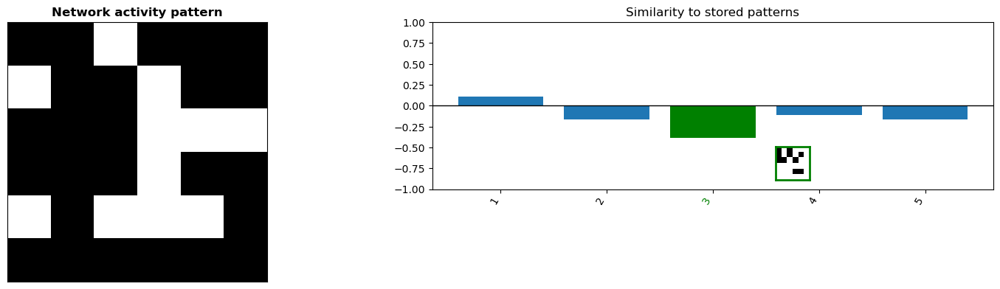

In [6]:
HFN.visualise();

**Q1 - What do you see?**

*We see the state of the network represented in black & white on the left panel, and its similarity to the 5 stored patterns on the right panel - where negative values indicate that it is somehow similar to anti-pattern 3.*

### **2.1 Setting the weight matrix** <a name="weights"></a>

Recall from the lecture than in order to remember a set of patterns the weight matrix should be set as follows: 

$$ w_{ij} = \sum_{n}\xi_{i}^{(n)} \xi_{j}^{(n)} $$

In python this can be written in a compact form using the `@` operator for matrix multiplication (including scalar product).

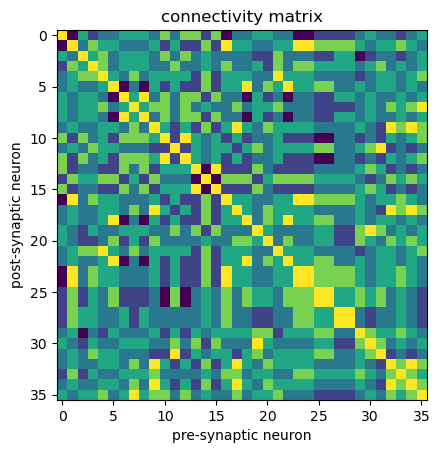

In [7]:
w = HFN.flattened_patterns.T @ HFN.flattened_patterns
plt.imshow(w);
plt.xlabel('pre-synaptic neuron');
plt.ylabel('post-synaptic neuron');
plt.title('connectivity matrix');

### **2.2 The update function** <a name="update"></a>

Recall from the lecture that the update function for a Hopfield Network is as follows:

1. Choose a random neuron, $i$
2. Update the value of the neuron according to 
$$s_{i}(t+1) = \textrm{sign}\big(\sum_{j}w_{ij}s_{j}(t)\big) = $$

**_📝TASK_** Complete the following code replica code for the `HFN.update_state()` function. 

In [8]:
# First: Choose a random neuron between 1 and HFN.n
i = np.random.randint(0,HFN.N_neurons)

# Second: Update the neuron
w = HFN.w 
state = HFN.state 

ss = 0
for j in range(HFN.N_neurons): # for all pre-synaptic neurons
    ss += w[i,j]*state[j] # add contribution from this neuron to input
# note: this can be written in a more compact and efficient form using matrix operation with the @ symbol

# take the sign
state[i] = np.sign(ss)

### **2.3 The Energy function** <a name="energy"></a>
The "energy" of the Hopfield network is defined as

$$E(\mathbf{s}) = -\frac{1}{2} \sum_{i}\sum_{j} s_{i} w_{ij} s_j$$

It's useful because: 
* It can only ever decrease (we must find a minima eventually) 
* The patterns, $\xi_{i}^{(n)}$, are _stable minima_ of the energy function (if patterns are uncorrelated and do not exceed memory capacity).

The following code calculates the energy function using this formula. You can also access directly using `HFN.get_energy(HFN.state)`

In [9]:
state = HFN.state
w = HFN.w

E =  -0.5 * HFN.state @ HFN.w @ HFN.state
print("Energy of this state:", E)

Energy of this state: -150.0


In [10]:
print("Energy of this state:",  HFN.get_energy(HFN.state))

Energy of this state: -150.0


---
## **3. Testing the Hopfield Network** <a name="testing"></a>

In [11]:
HFN = HopfieldNetwork(random_patterns)

Congratulations! You just built your first Hopfield  Network. Lets test it out. 

In the upcoming sections we're going to see a number of things: 

3. [Testing the Hopfield Network](#testing)
    1. [Pattern stability](#stability): Patterns which are "memories" of the network are stable. 
    2. [Pattern denoising](#denoising): The network recovers patterns it starts "near" to
    3. [Pattern completion](#completion): The network completes partial patterns
    4. [Negative patterns](#negative): Negative patterns are stable
    5. [Spurious states](#spurious): Mixtures of patterns are stable 
    6. [Strong patterns](#strong): We can embed some patterns more strongly than others
    7. [Memory capacity](#capacity): Too many memories and the network starts to fail
    8. [Complex patterns (faces)](#faces): The network can't learn highly complex patterns. 


First thing we'll try is initialising it _close_ to one of the stored patterns and seeing how it evolves: 

### **3.1 Pattern stability** <a name="stability"></a>

The learned patterns should be stable fixed points of the system dynamics. As you can see, the state after 200 iterations is the same as the starting point, and consequently the energy of the system does not move.

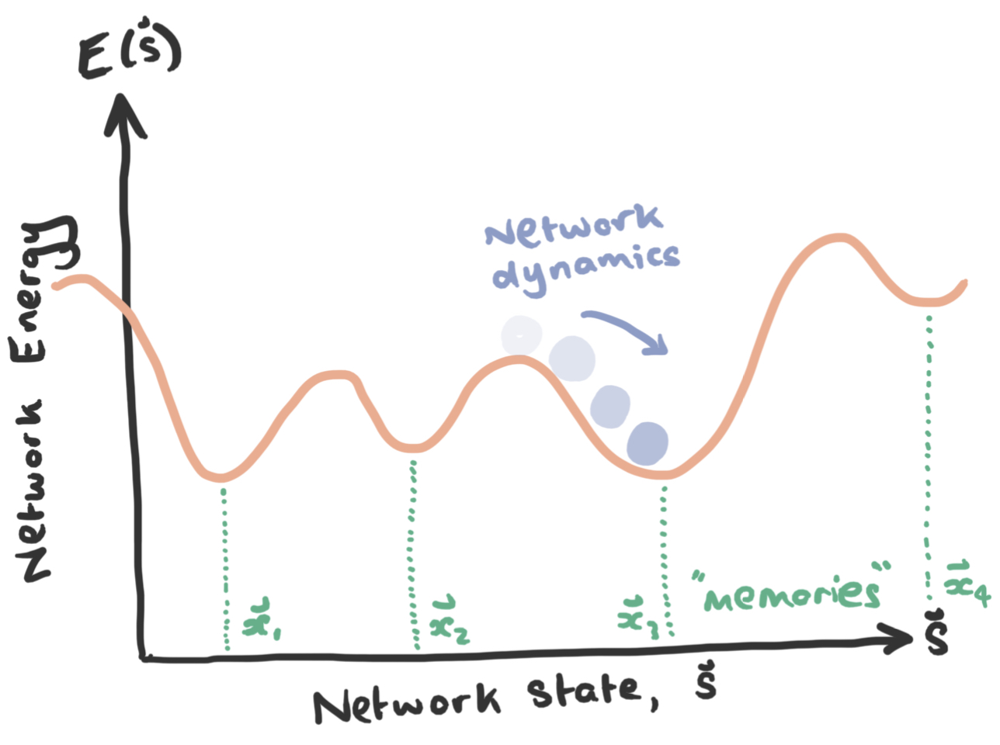

In [12]:
#@title Run this code, but feel free to ignore it. {display-mode: "form" }
from IPython.display import Image
display(Image(filename='./images/hopfield_dynamics.png', width=600))

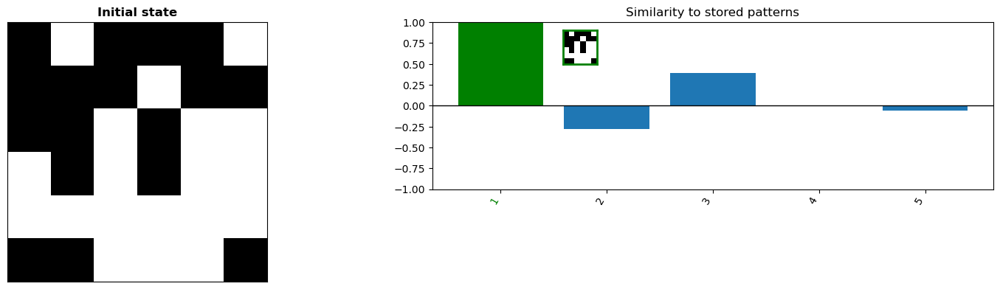

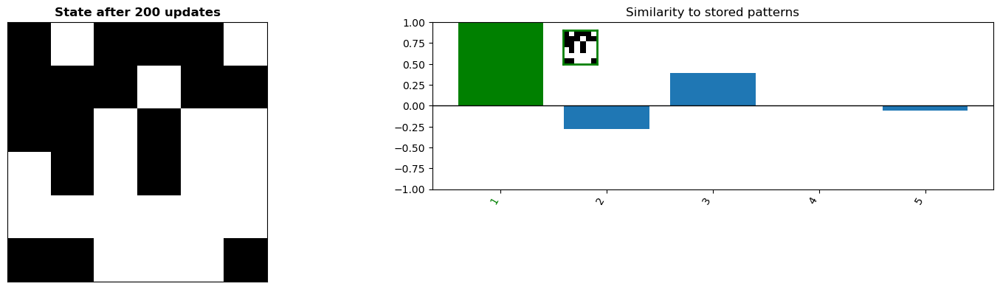

In [13]:
pattern_to_start = '1'

HFN.set_state(random_patterns[pattern_to_start].flatten()) #reinitialise the state of the network
HFN.visualise(title="Initial state")
for i in range(200):
    HFN.update_state()
HFN.visualise(title=f"State after {i+1} updates");

n_steps: 200


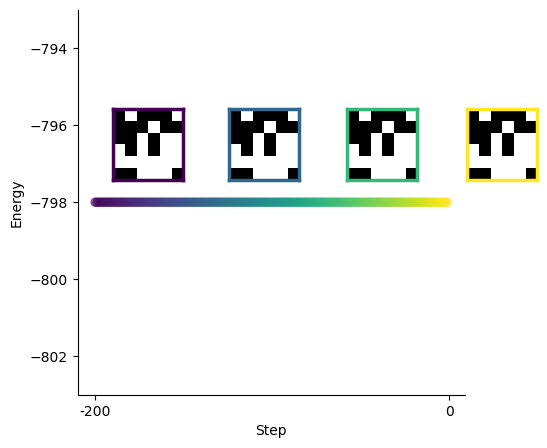

In [14]:
fig, ax = HFN.plot_energy(n_steps=200)

### **3.2 Pattern denoising**  <a name="stability"></a>

Better yet...if we start _near_ one of the saved patterns. 
We'll do this by randomly flipping a percentage `X` of our bits.

n_steps: 200


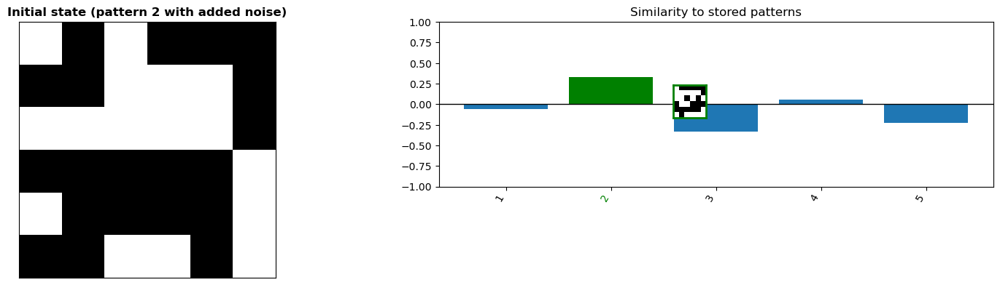

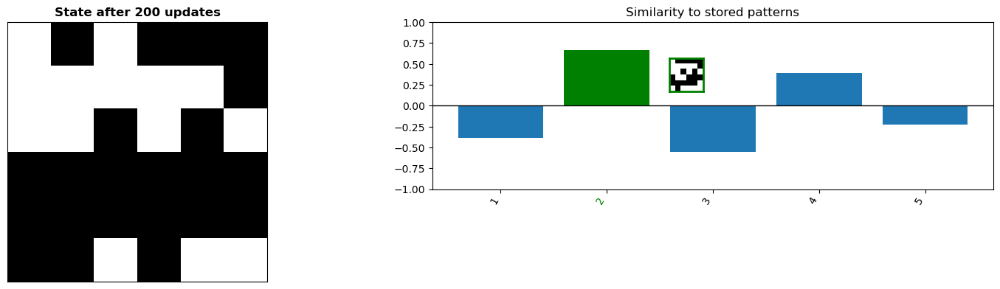

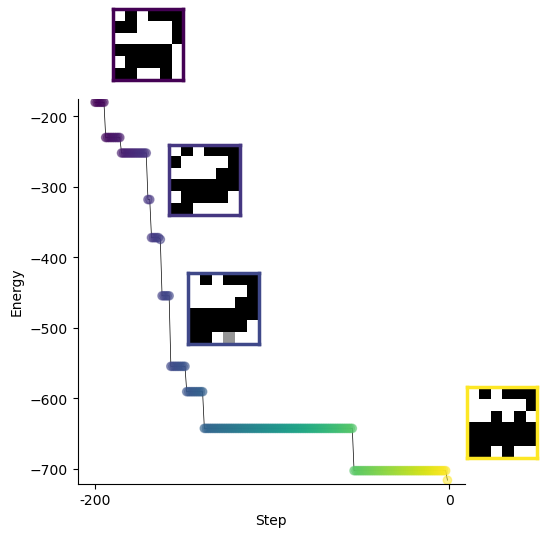

In [15]:
pattern_to_start = '2' # which of the 5 patterns we start from 
X = 20 # percentage of bits to flip 

noisy_state = random_patterns[pattern_to_start].flatten() * np.random.choice([-1,1],p=[X/100,1-X/100],size=(HFN.N_neurons,))

HFN.set_state(noisy_state) #reinitialise the state of the network
HFN.visualise(title=f"Initial state (pattern {pattern_to_start} with added noise)");
for i in range(200):
    HFN.update_state();
HFN.visualise(title=f"State after {i+1} updates");
HFN.plot_energy(n_steps=200);

**Q2 - Has it accurately recovered the pattern we started near?**

*Yes, we see that the overlap with pattern 2 goes from 0.7 to 1, meaning that it converges to exactly this pattern.*

**Q3 - Try again but with `X=50`% of the pattern flipped. Does it reliably recover the pattern now?**

*No, we're now starting too far away in the energy landscape and converge to a different attractor - which changes every time we run the simulation, as the actual starting point is different.*

### **3.3 Pattern completion** <a name="completion"></a>
Now let's test what happens if we occlude part of a pattern (i.e. the initial values of the masked units are neither -1 nor 1 but 0)....
We can do this with the `mask_pattern()` function. Here we're only masking the last column and the last row in the image.

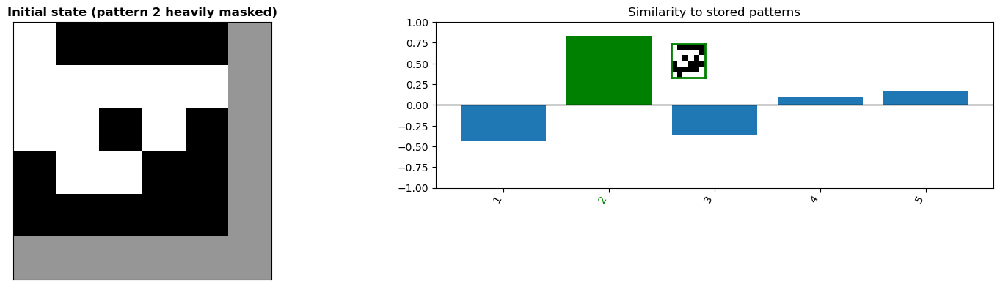

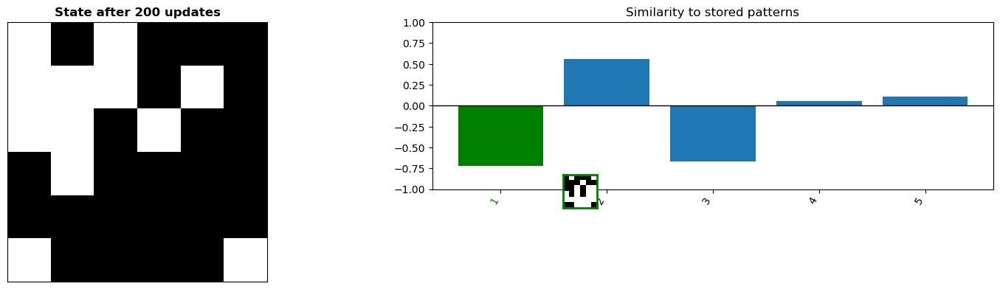

In [16]:
pattern_to_start = '2'  
partially_masked_pattern = mask_pattern(random_patterns[pattern_to_start])
HFN.set_state(partially_masked_pattern) #reinitialise the state of the network
HFN.visualise(title=f"Initial state (pattern {pattern_to_start} heavily masked)");
for i in range(200):
    HFN.update_state()
HFN.visualise(title=f"State after {i+1} updates");

n_steps: 200


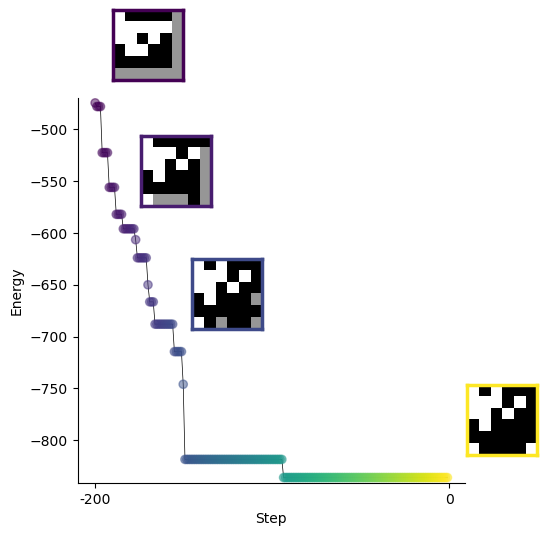

In [17]:
HFN.plot_energy(n_steps=200);

**Q4 - Could we retrieve the full pattern? (Try it multiple times)**

*Sometimes yes, but other times if falls in another attractor state (specifically anti-pattern 1)*

### **3.4 Negative patterns** <a name="negative"></a>

Theory tells us negative patterns should be stable fixed points just like the original patterns. Let's test this. 

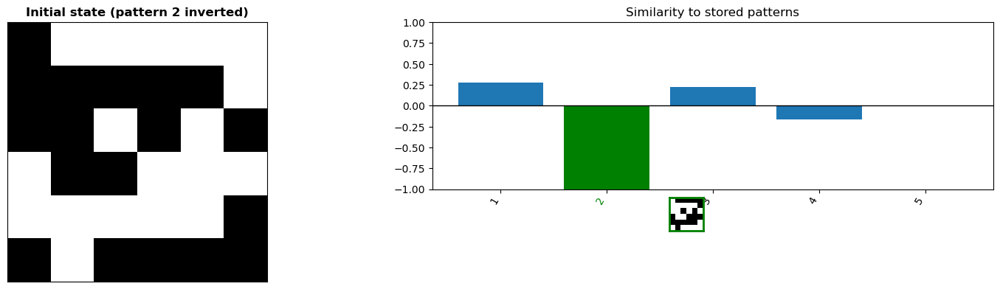

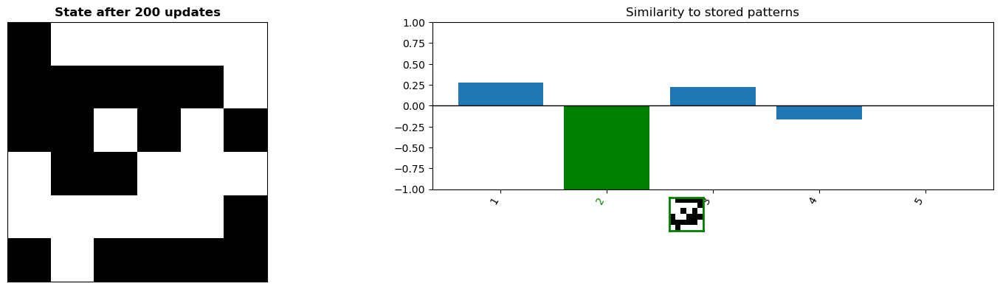

In [18]:
pattern_to_start = '2'  

##### !!! #####
negative_pattern = -random_patterns[pattern_to_start] #note the negative sign
HFN.set_state(negative_pattern) 
##### !!! #####

HFN.visualise(title=f"Initial state (pattern {pattern_to_start} inverted)");
for i in range(200):
    HFN.update_state()
HFN.visualise(title=f"State after {i+1} updates");

**Q5 - What do you conclude?**

*Indeed, negative patterns are stable states of the network (we saw previously that other states could converge to these)*

### **3.5 Mixed states and spurious states** <a name="spurious"></a>

What happens if we try initialise the network in a mixed state. For example and mix of patterns 1, 2 and 3: 

$$ s_i(0) := \xi_i^{\textrm{mix}} = \textrm{sgn} \big( \pm \xi_i^{(1)} \pm \xi_i^{(2)} \pm \xi_i^{(3)} \big)$$

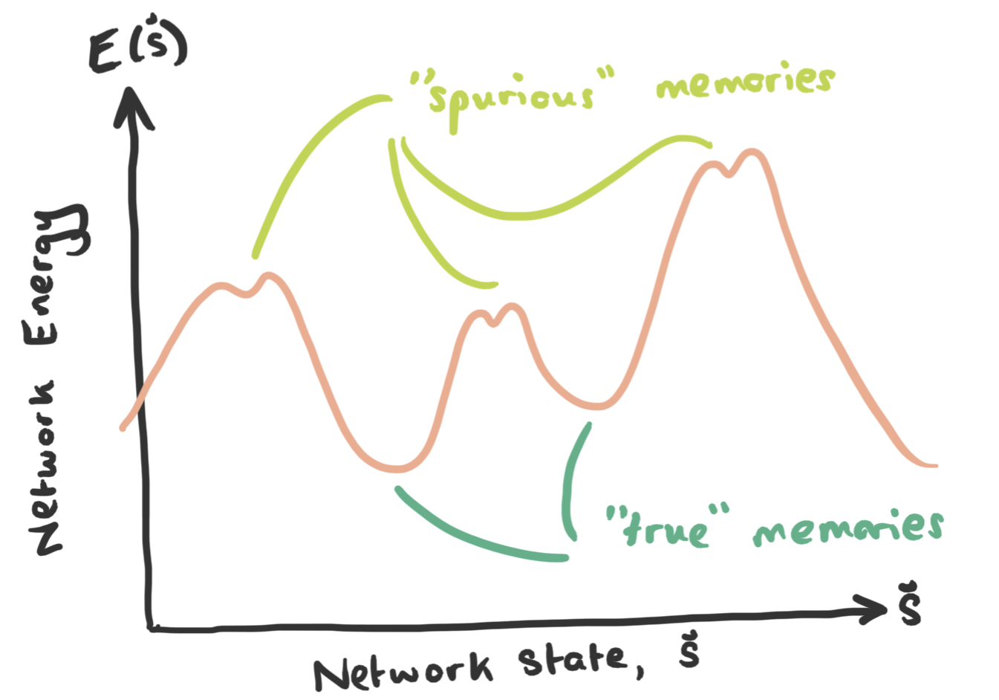

In [19]:
#@title Run this code, but feel free to ignore it. {display-mode: "form" }
from IPython.display import Image
display(Image(filename='./images/spurious_states.png', width=600))

n_steps: 200


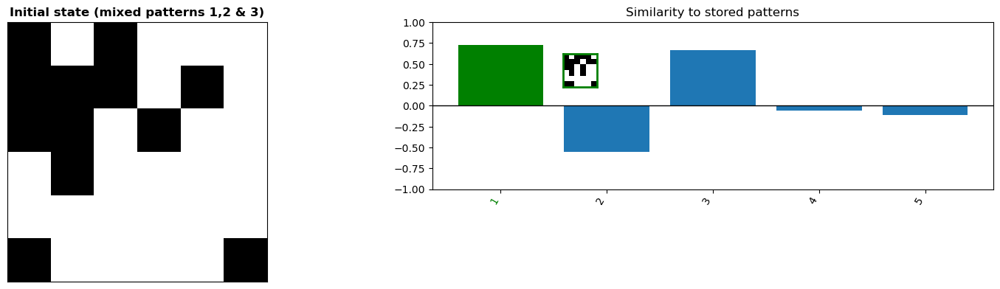

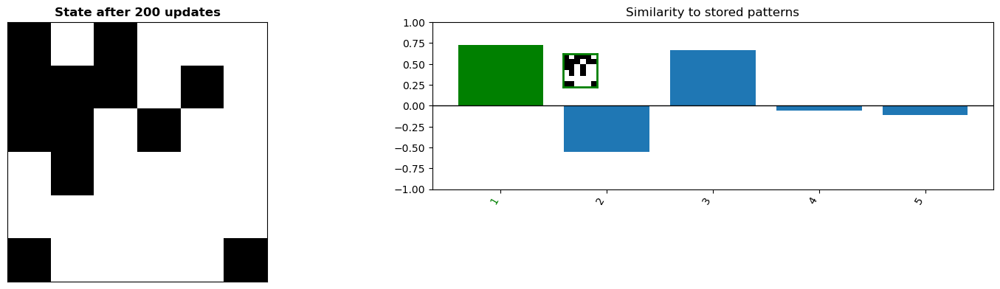

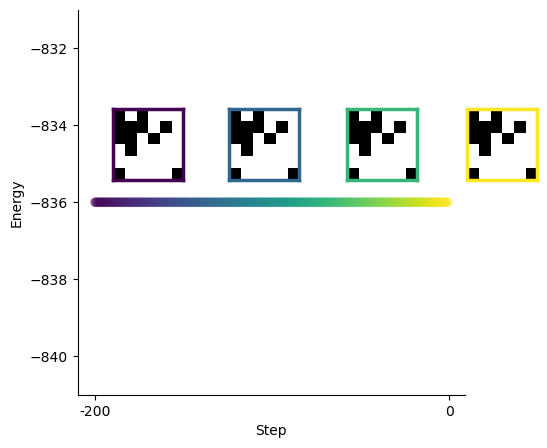

In [20]:
##### !!!!! #####
mixed_state = np.sign(random_patterns['1'].flatten() - random_patterns['2'].flatten() + random_patterns['3'].flatten())
##### !!!!! #####

HFN.set_state(mixed_state) #reinitialise the state of the network
HFN.visualise(title=f"Initial state (mixed patterns 1,2 & 3)");
for i in range(200):
    HFN.update_state()
HFN.visualise(title=f"State after {i+1} updates");
HFN.plot_energy(n_steps = 200);

We see that this chimera (mixture of patterns) is a stable state.

### **3.6 Strong patterns** <a name="strong"></a>

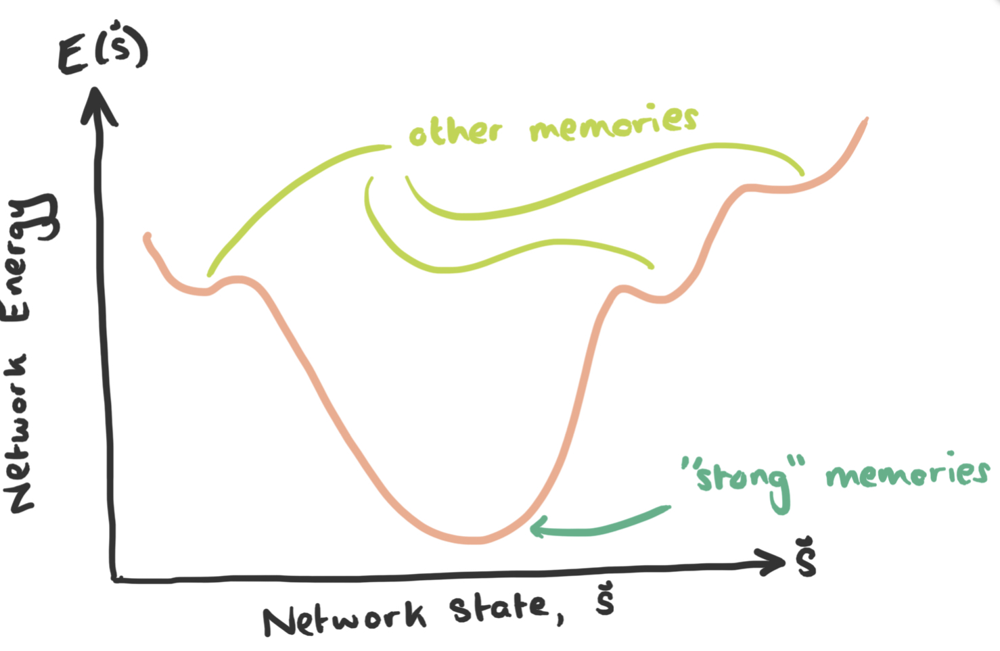

In [21]:
#@title Run this code, but feel free to ignore it. {display-mode: "form" }
from IPython.display import Image
display(Image(filename='./images/strong_patterns.png', width=600))

We can embed some patterns into the network _more strongly_ than others. 

* Here's a "smiley" face pattern.
* We'll embed _three times_ into the same network, along with 7 other random patterns. 

Text(0.5, 0.98, 'The patterns we will learn. We purposefully bias towards one pattern more than others')

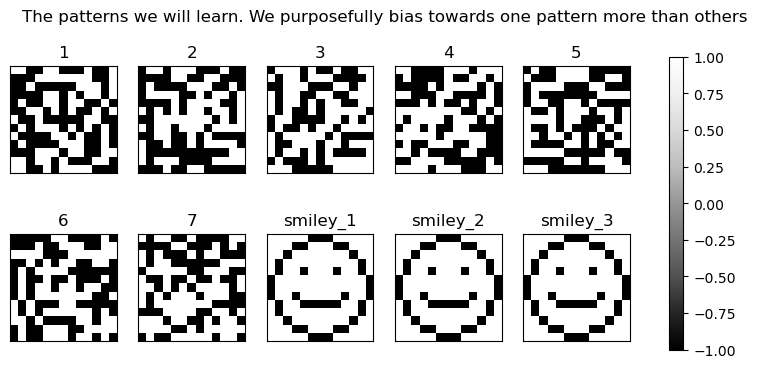

In [22]:
smiley_state = np.array([
    [ 1, 1, 1, 1, 1,-1,-1,-1, 1, 1, 1, 1, 1],
    [ 1, 1, 1,-1,-1, 1, 1, 1,-1,-1, 1, 1, 1],
    [ 1, 1,-1, 1, 1, 1, 1, 1, 1, 1,-1, 1, 1],
    [ 1,-1, 1, 1, 1, 1, 1, 1, 1, 1, 1,-1, 1],
    [ 1,-1, 1, 1,-1, 1, 1, 1,-1, 1, 1,-1, 1],
    [-1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,-1],
    [-1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,-1],
    [-1, 1, 1,-1, 1, 1, 1, 1, 1,-1, 1, 1,-1],
    [ 1,-1, 1, 1,-1,-1,-1,-1,-1, 1, 1,-1, 1],
    [ 1,-1, 1, 1, 1, 1, 1, 1, 1, 1, 1,-1, 1],
    [ 1, 1,-1, 1, 1, 1, 1, 1, 1, 1,-1, 1, 1],
    [ 1, 1, 1,-1,-1, 1, 1, 1,-1,-1, 1, 1, 1],
    [ 1, 1, 1, 1, 1,-1,-1,-1, 1, 1, 1, 1, 1],
])

random_patterns = {str(i) : np.random.choice([-1,1],size=(13,13)) for i in range(1,7+1)}
random_patterns['smiley_1'] = smiley_state
random_patterns['smiley_2'] = smiley_state
random_patterns['smiley_3'] = smiley_state
fig, ax = plot_patterns(random_patterns)
fig.suptitle("The patterns we will learn. We purposefully bias towards one pattern more than others")

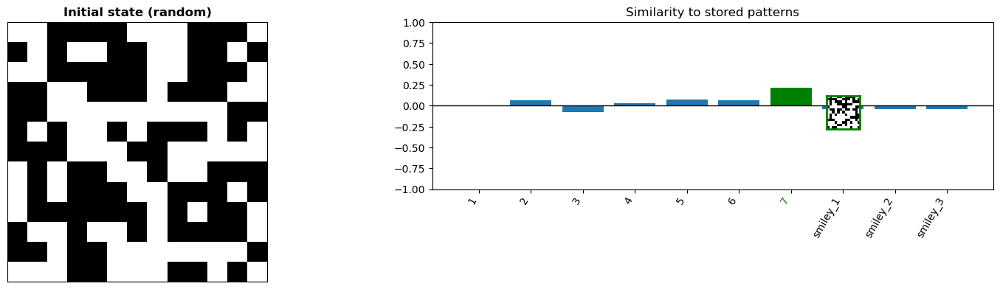

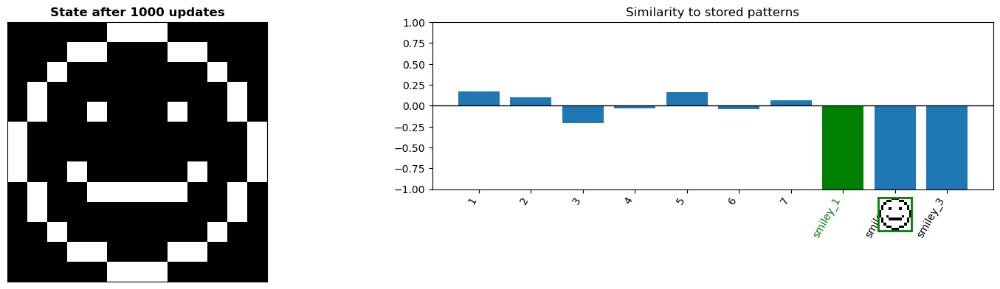

In [23]:
HFN = HopfieldNetwork(random_patterns)
HFN.set_state(random=True) #reinitialise the state of the network
HFN.visualise(title="Initial state (random)")
for i in range(1000):
    HFN.update_state()
HFN.visualise(title=f"State after {i+1} updates");

Try running this many times.

**Q6 - What do you observe? What does this tell us about the energy landscape and how might this relate to biological memories?** 

*It almost always converges on the smiley face pattern (or the anti-pattern), not one of the other random patterns. Because the smiley face has three times more impact on the connectivity matrix than the other patterns we stored, the energy landspace now just have two stable attractors: the smiley face and its anti pattern.*

n_steps: 1000


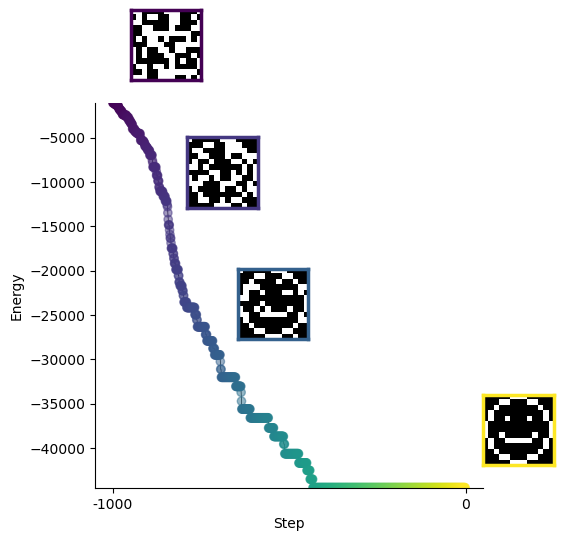

In [24]:
HFN.plot_energy(n_steps=1000);

We can animate this progression of states using the `HFN.animate()` method

In [25]:
HFN.animate(n_steps=1000)

### **3.7 Testing the memory capacity** <a name="capacity"></a>

Lets try the same but in a network with **more patterns** and **fewer neurons**.

By doing so we may demonstrate some of the memory issues suffered by classical Hopfield networks.

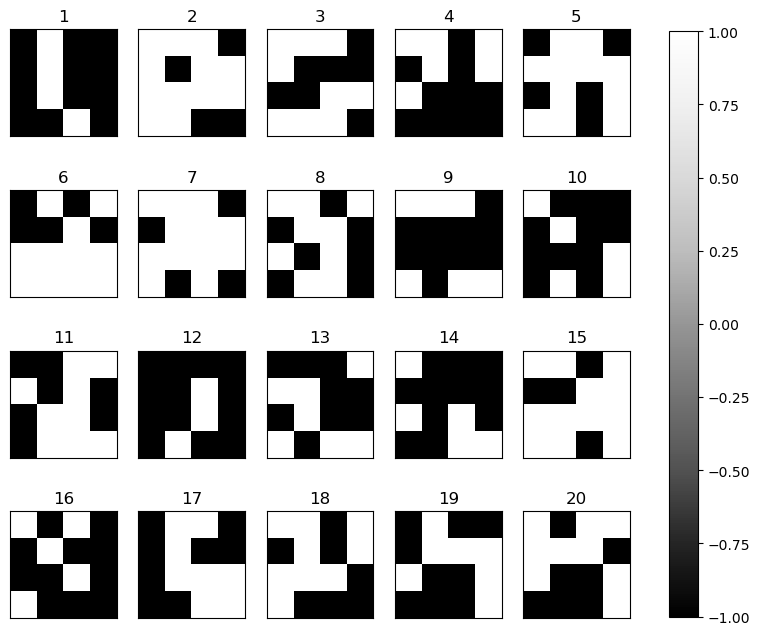

In [26]:
#Create 20 random patterns of size 4x4
np.random.seed(42)
N_patterns = 20
pattern_size = (4,4)
random_patterns_many = {str(i) : np.random.choice([-1,1],size=pattern_size) for i in range(1,N_patterns+1)}
fig, ax = plot_patterns(random_patterns_many)

HFN = HopfieldNetwork(random_patterns_many)

Theory has told us that the memory capacity of a Hopfield Network (roughly how many memories we can store before they become unstable) becomes an issue once the number of memories exceeds 13% the number of neurons. 

$$ N_{\textrm{memories}} \sim 0.138 \times N_{\textrm{Neurons}} $$

For our 4 x 4 patterns there are 16 neurons...so we should expect errors to start piling up once we have more than $0.138 \times 36 \approx 5$ patterns! Let's test how many of the 20 patterns are unstable.

20.0% of the memory patterns are unstable. These are ['1', '6', '10', '13']


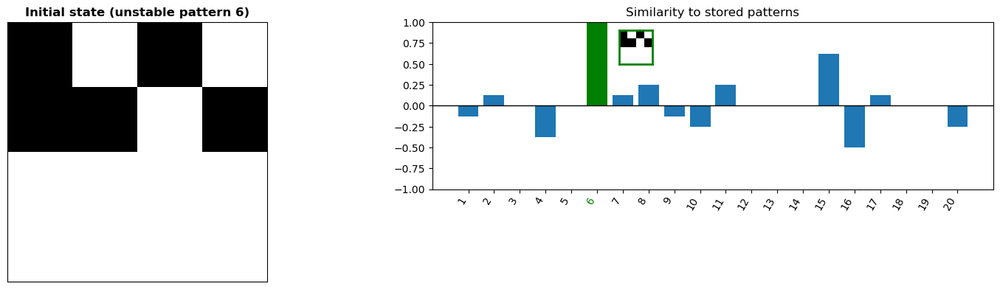

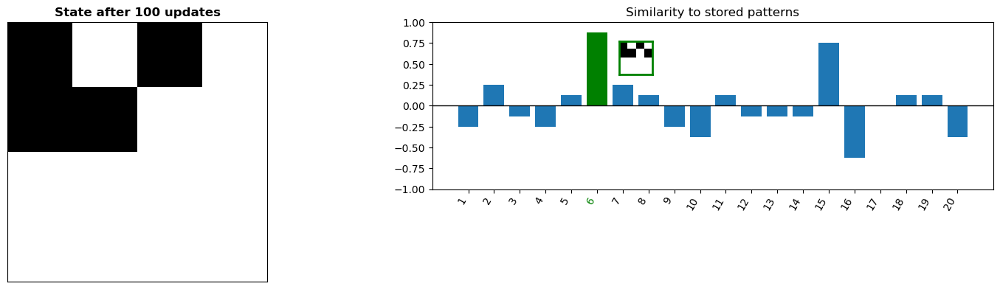

In [27]:
# test ALL the memories and set which ones are unstable
unstable_patterns = []
for pattern in random_patterns_many:

    # set initial state to one stored pattern
    HFN.set_state(random_patterns_many[pattern].flatten())
    initial_state = copy.deepcopy(HFN.state)

    # run dynamics of Hopfield network for 100 iterations
    for i in range(100):
        HFN.update_state(asynchronous=True)
    if not np.all(initial_state == HFN.state): #if final state for not match initial state, it means it the pattern is unstalbe
        unstable_patterns.append(pattern) # then add it to the list

print(f"{100*len(unstable_patterns)/len(random_patterns_many):.1f}% of the memory patterns are unstable. These are {unstable_patterns}")

#visualise an unstable memory
if len(unstable_patterns) > 0:
    HFN.set_state(random_patterns_many[unstable_patterns[1]].flatten()) #reinitialise the state of the network
    HFN.visualise(title=f"Initial state (unstable pattern {unstable_patterns[1]})")
    for i in range(100):
        HFN.update_state()
    HFN.visualise(title=f"State after {i+1} updates")

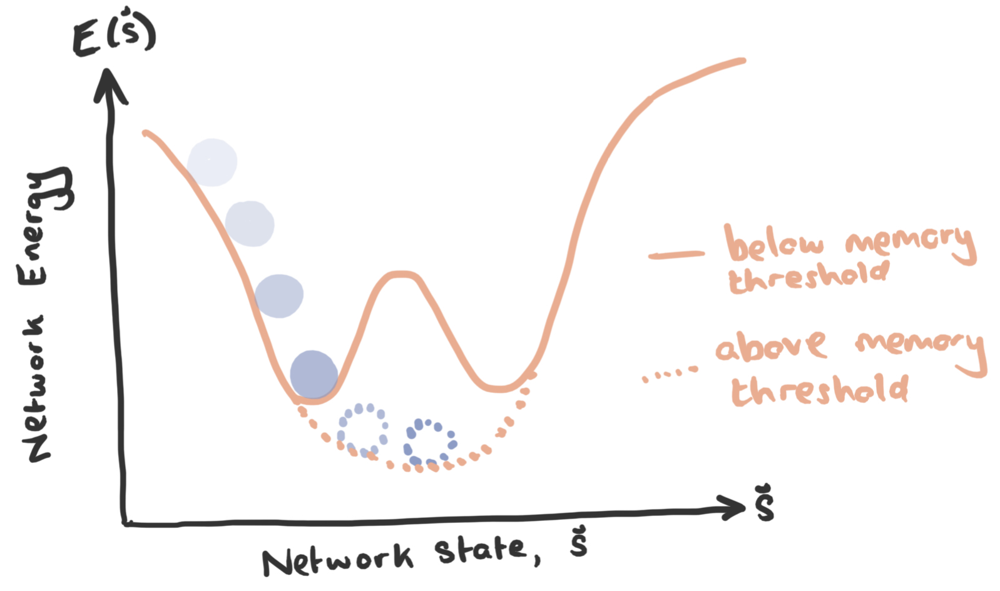

In [37]:
#@title Run this code, but feel free to ignore it. {display-mode: "form" }
from IPython.display import Image
display(Image(filename='./images/memory_threshold.png', width=600))

**Q7 - What do you observe? What does this tells us about the precision of memory retrievals when the memory capacity is saturated?**

*4 patterns out of 20 are unstable. Usually they converge to another pattern which is just one or two pixels away from the original pattern. This illustrates that when capacity is saturated, interference from other memories may alter the precision of memory retrieval.*

### **3.8 Complex patterns: Faces** <a name="faces"></a>

Here we've downloaded faces from 15 of this class participants from freely available pictures in the Internet and converted them to greyscale.

Face data successful loaded!


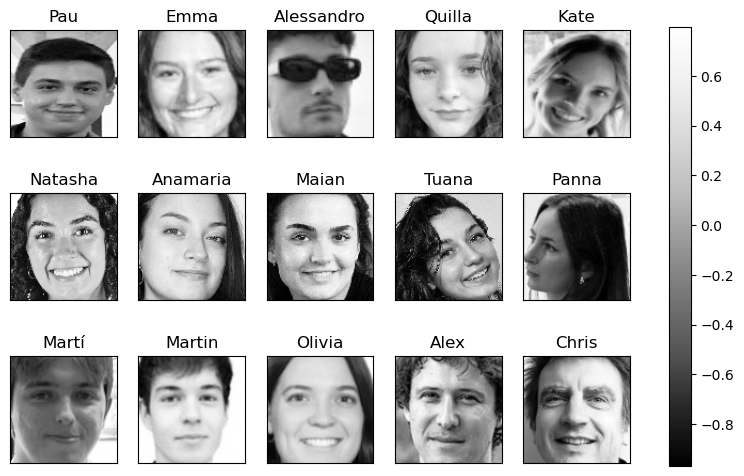

In [28]:
faces = pickle.load(open("faces.pkl","rb"))
print("Face data successful loaded!")
fig, ax = plot_patterns(faces)

In [29]:
# Initialise a new Hopfield network with the flags as patterns
HFN = HopfieldNetwork(faces)

Let's check whether these faces are stable attractors of the network.

n_steps: 5


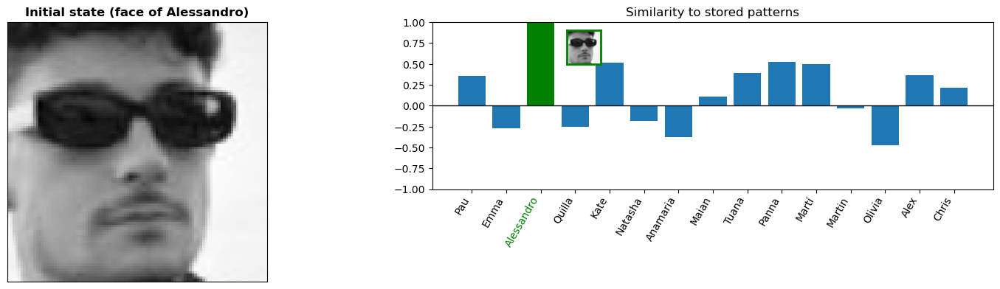

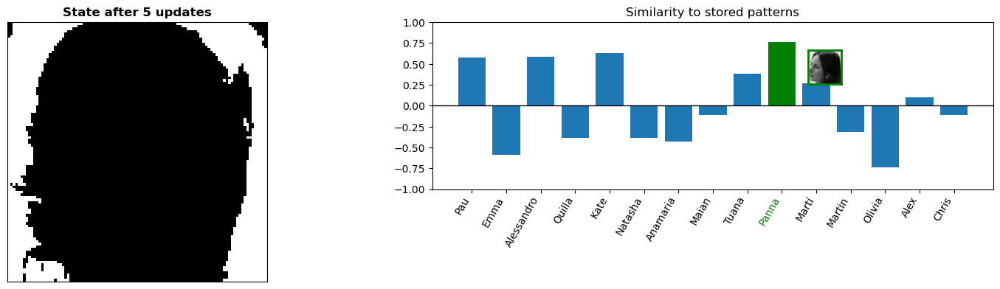

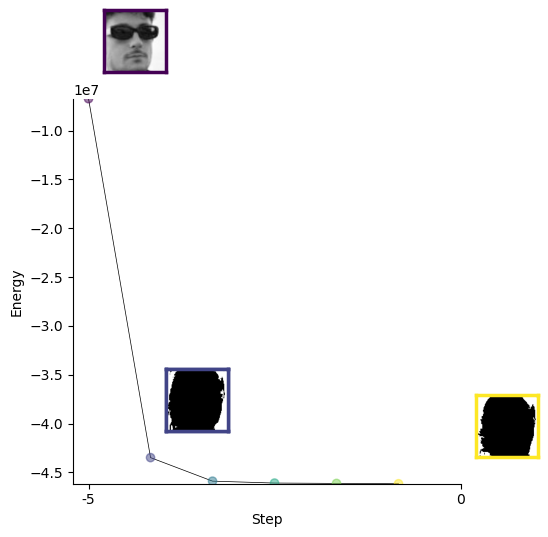

In [30]:
# try with various!
person = 'Alessandro'
# person = 'Kate'

HFN.set_state(faces[person].flatten()); #reinitialise the state of the network
HFN.visualise(title=f"Initial state (face of {person})");
for i in range(5):
    HFN.update_state(asynchronous=False)
HFN.visualise(title=f"State after {i+1} updates");

HFN.plot_energy(n_steps = 5);

#### Hmmmmm...not great. :(

Try with a few other faces. 
Let's investigate why the network does not perform very well at learning faces.  
One reason might be that face images **aren't binary** (+1, -1) patterns. This definitely doesn't help but the problems are more fundamental: patterns get corrupted, not just binarised. 

**Q8 - Does the number of faces (15) exceed the memory capacity of the network?** Images are 100 x 100 pixels.

*Certainly not. Theory tells us the capacity of a Hopfield Network is $N_{\textrm{capacity}} \approx 0.138 N_{\textrm{neurons}}$. Here there is one neuron for each pixel (100 x 100 = 10,000) so the capacity should be 1380 which is wayyyy bigger than the number of faces.*

**Q9 - So what can explain that faces are not properly recovered?** For inspiration, you can have a look at the values of overlap after the final updates for faces, and compare it to the values obtained in the first example with just 5 patterns where retrieval worked well.

*Face images are **too correlated**. For example at the large scale all faces have some kind of ovale shape of a certain colour with darker areas around the eyes and mouth. On finer spatial scale, nearby pixels tend to be very similar (unlike for random patterns that we used previously). This is visible in the overlaps: the final state has large overlap (in absolute value) with many different faces, as if it converged so some raw prototypical image of a face (this is a bit like the case of the smiley face, but where each face is now slightly different).*

---

## **4.0 Modern Hopfield Networks** <a name="modern"></a>

I turns out its possible to improve the performance of Hopfield networks. For a full discussion see this  [resource](https://ml-jku.github.io/hopfield-layers/) - with some unexpected connection to transformers!

_Modern Hopfield Networks_ have a slightly modified energy and update function compared to _Classical Hopfield Networks_

| | **Classic** | **Modern** |
| ----------- | ----------- | ----------- |
| **Update rule** | $ \vec{s} \leftarrow \textrm{sign}\big(\underbrace{\vec{\xi}\vec{\xi}^{\mathsf{T}}}_{\mathsf{w}}\vec{s}\big)$ | $\vec{s} \leftarrow \vec{\xi} \textrm{softmax}(\beta \vec{\xi}^{\mathsf{T}}\vec{s})$ |
| **Energy function** | $ E(\vec{s}) = \vec{s}^{\mathsf{T}}\underbrace{\vec{\xi}\vec{\xi}^{\mathsf{T}}}_{\mathsf{w}}\vec{s}$ | $E(\vec{s}) = -\textrm{lse}\big(\vec{\xi}^{\mathsf{T}}\vec{s}\big) + \frac{1}{2} \vec{s}^{\mathsf{T}}\vec{s}$ |

where softmax and lse are smooth continuous functions. You don't need to understand these functions or these equations except to realise that

* It's just another way to update networks of neurons. In both cases, the udates and energy of the network depend on
    * The state of the network, $\vec{s}$
    * The patterns, $\vec{\xi}$ (in the _classic_ case we used these to define a new quantity called the weight matrix $\mathsf{w} = \vec{\xi}\vec{\xi}^{\mathsf{T}}$ 



This class inherits from our original `HopfieldNetwork` class so we can use all the same plotting functions 

In [31]:
class ModernHopfieldNetwork(HopfieldNetwork):
    def __init__(self,patterns,beta=0.01):
        self.beta=beta
        super().__init__(patterns)
    
    def update_state(self):
        """This is the ONLY difference between ModernHopfieldNetwork and HopfieldNetwork. Igt has a slightly different update rule.
        Note the use of a softmax function to make the network dynamics more continuous"""

        self.state += 0.1 * (self.flattened_patterns.T @  softmax(self.beta * self.flattened_patterns @ self.state) - self.state)
        self.similarities = self.get_similarities()
        self.energy = self.get_energy()
        self.save_history()
 
    def get_energy(self,state=None):
        """Modern Hopfield Networks have slightly different energy functions. You can ignore this function for now."""
        state = self.state if state is None else state
        return -log_sum_exp(self.flattened_patterns @ state, beta=self.beta) + 0.5 * state @ state

Let's apply these Modern Hopfield Networks to our face database. As you will notice, the activity in these network is no longer binary but continuous (between -1 and 1), so it can reproduce a grayscale image.

In [32]:
MHFN = ModernHopfieldNetwork(faces, 
                             beta=0.05, #the "inverse temperature" 
                            )

n_steps: 50


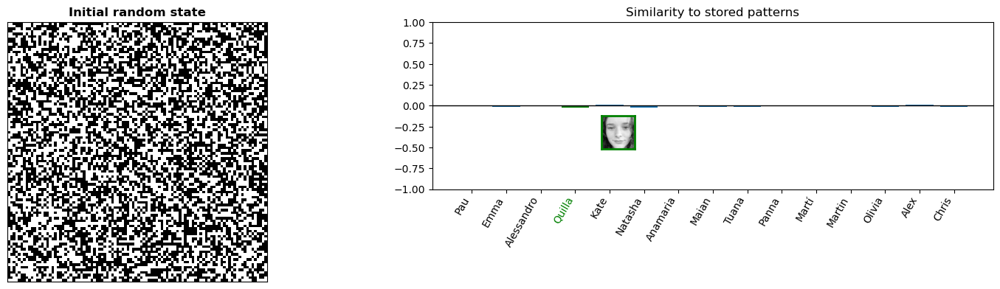

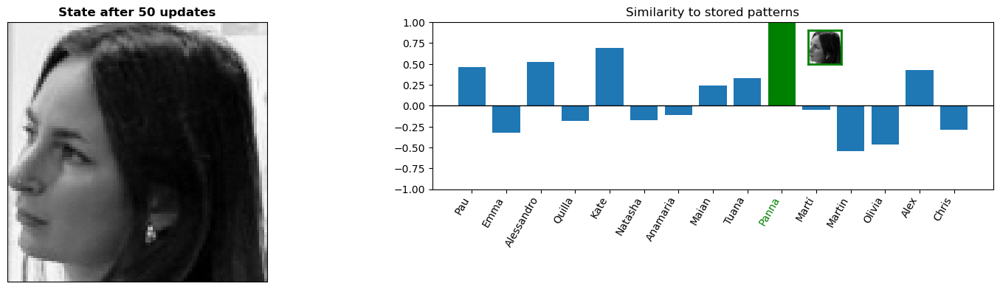

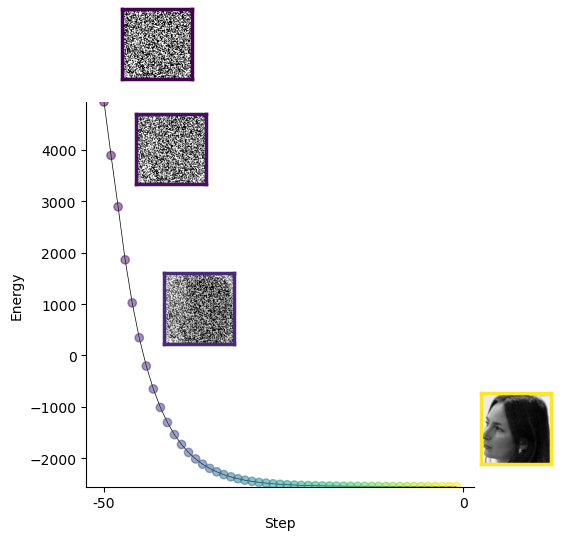

In [33]:
MHFN.set_state(random=True) #reinitialise the state of the network
MHFN.visualise(title=f"Initial random state")
for i in range(50):
    MHFN.update_state()
MHFN.visualise(title=f"State after {i+1} updates")
fig, ax = MHFN.plot_energy(n_steps=i+1)

Lets try mask a face and set it it can "pattern complete" it. Can the network recover the identity of our mistery man?

In [34]:
person = "Martin"
masked_flag = mask_pattern(faces[person], prop=.5)# your code here 

MHFN.set_state(masked_flag)
#now update the Modern Hopfield Network for 20 states 
for i in range(20):
    MHFN.update_state()

MHFN.animate(n_steps=20)

### **4.1 Memorability test!!** <a name="mem_test"></a>

Is your face more memorable than your neighbour's face?
Here we come up with a stupid (and nerdy) response to this stupid question.

The `merge_pattterns(pattern1, pattern2)` function combines two pattern (half on the left half on the right). 

If we initialise the network in this merged state, which face will network converge to? Only dynamics will tell...


In [35]:
person1 = 'Alex'
person2 = 'Chris'

merged_face = merge_patterns(faces[person1],faces[person2])

MHFN = ModernHopfieldNetwork(faces)
MHFN.set_state(merged_face)
MHFN.visualise(title=f"Initial state (merged faces of {person1} and {person2})")
for i in range(50):
    MHFN.update_state()

MHFN.animate(n_steps=50)

In [36]:
#test which is most similar 
face_names = np.array(list(faces.keys()))
person1_score, person2_score = MHFN.similarities[face_names == person1][0], MHFN.similarities[face_names == person2][0]
print(f"The winner is....{person1_score.upper() if person1_score > person2_score else person2.upper()}!")

The winner is....CHRIS!


### **4.2 The "inverse-temperature", $\beta$** <a name="temperature"></a>

In the update function for the Modern Hopfield Network we use a scalar quantity called $\beta$. THis is often called the "inverse temperate.

* High values of $\beta$ correspond to a _low temperatures_ and mean that the attraction basins of the individual patterns remain separated. It is unlikely that metastable states appear. 
* Low values of $\beta$ on the other hand correspond to a high temperature and the formation of metastable states becomes more likely.

**Q10 - Try the above but with a much _higher_ temperature (i.e. a _lower_ $\beta$, try $\beta \leftarrow 0.001$). What happens?**

*Now the network does not converge to patterns (faces) but rather to mixtures of images (metastable states).*

**Q11 - These flags have to be in greyscale. How might we upgrade this network to allow it to remember coloured patterns?**

*Colour can be coded for example as RGB code (for the brain with the 3 different types of cone receptors). So for each pixel we could have 3 different neurons encoding the R, G and B values.*

---

## **Congrats!**
Well done. You made it to the end of the tutorial! 

This tutorial was adapted from a tutorial by Tom George (UCL) given at the TReND CaMinA (Computational Neuroscience and Machine Learning Summer School), 2024 - massive kudos to Tom ([Github](https://github.com/TomGeorge1234), [Google Scholar](https://scholar.google.com/citations?user=AG49j3MAAAAJ&hl=en)).